In [252]:
"""Import modules required to run the Jupyter notebook."""
import os
from pathlib import Path

# Clear logger to use tiatoolbox.logger
import logging
import warnings

if logging.getLogger().hasHandlers():
    logging.getLogger().handlers.clear()

import cv2
import joblib
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np

import tiatoolbox
from tiatoolbox import logger
from tiatoolbox.models.engine.nucleus_instance_segmentor import NucleusInstanceSegmentor
from tiatoolbox.utils.misc import download_data, imread
from tiatoolbox.tools import patchextraction

# We need this function to visualize the nuclear predictions
from tiatoolbox.utils.visualization import (
    overlay_prediction_contours,
)
from tiatoolbox.wsicore.wsireader import WSIReader

warnings.filterwarnings("ignore")
mpl.rcParams["figure.dpi"] = 300  # for high resolution figure in notebook
mpl.rcParams["figure.facecolor"] = "white"  # To make sure text is visible in dark mode
plt.rcParams.update({"font.size": 5})

import pandas as pd

from tqdm.auto import tqdm
from PIL import Image

In [163]:
ON_GPU=True

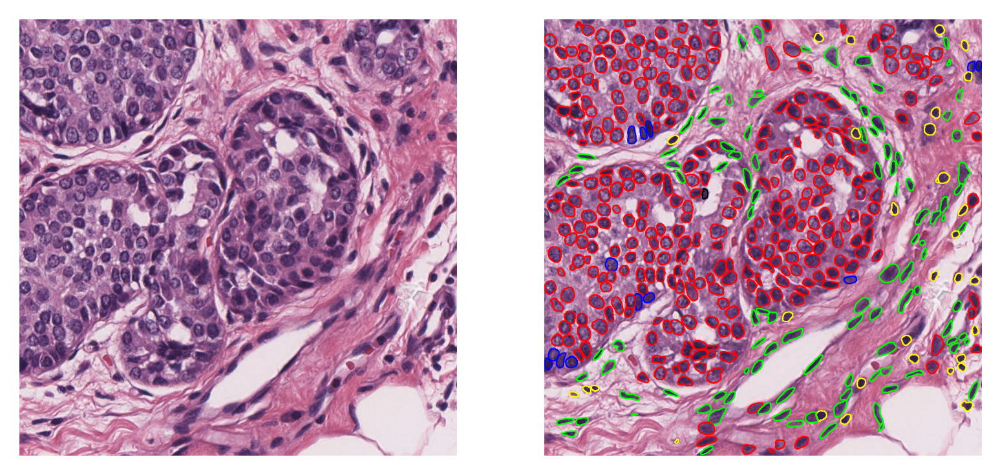

In [13]:
# Reading the original image
tile_img = imread(img_file_name)

# defining the coloring dictionary:
# A dictionary that specifies a color to each class {type_id : (type_name, colour)}
color_dict = {
    0: ("neoplastic epithelial", (255, 0, 0)),
    1: ("Inflammatory", (255, 255, 0)),
    2: ("Connective", (0, 255, 0)),
    3: ("Dead", (0, 0, 0)),
    4: ("non-neoplastic epithelial", (0, 0, 255)),
    5: ("background", (255, 165, 0)),
}

# Create the overlay image
overlaid_predictions = overlay_prediction_contours(
    canvas=tile_img,
    inst_dict=tile_preds,
    draw_dot=False,
    type_colours=color_dict,
    line_thickness=2,
)

# showing processed results alongside the original images
fig = plt.figure()
ax1 = plt.subplot(1, 2, 1), plt.imshow(tile_img), plt.axis("off")
ax2 = plt.subplot(1, 2, 2), plt.imshow(overlaid_predictions), plt.axis("off")

In [23]:
color_dict = {
    0: ("neoplastic epithelial", (255, 0, 0)),
    1: ("Inflammatory", (255, 255, 0)),
    2: ("Connective", (0, 255, 0)),
    3: ("Dead", (0, 0, 0)),
    4: ("non-neoplastic epithelial", (0, 0, 255)),
}


In [5]:
fixed_patch_extractor = patchextraction.get_patch_extractor(
    input_img=wsi_file_name,  # input image path, numpy array, or WSI object
    method_name="slidingwindow",  # also supports "point" and "slidingwindow"
    patch_size=(
        2000,
        2000,
    ),  # size of the patch to extract around the centroids from centroids_list
    # stride=(500, 500),  # stride of extracting patches, default is equal to patch_size
    input_mask="otsu",
    min_mask_ratio=0.5,

)

In [6]:
len(fixed_patch_extractor)

333

(-0.5, 1999.5, 1999.5, -0.5)

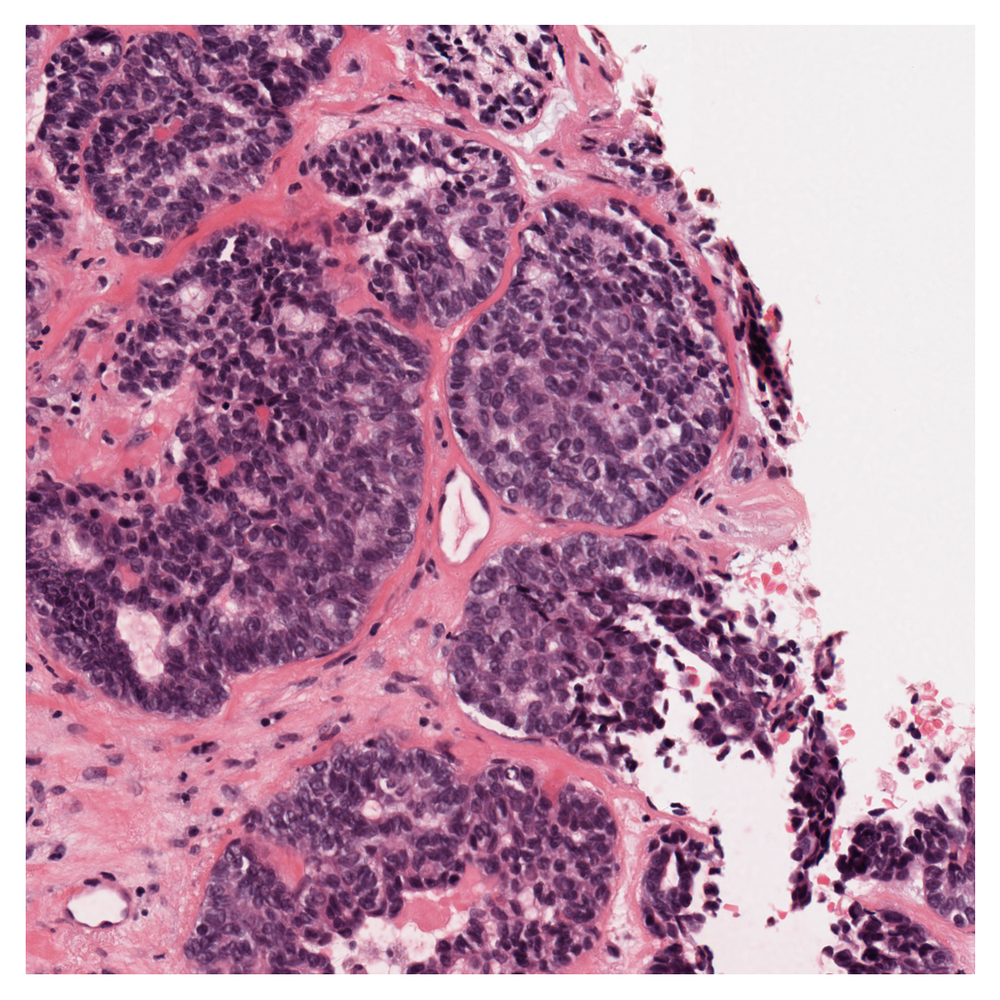

In [7]:
plt.imshow(fixed_patch_extractor[10])
plt.axis("off")


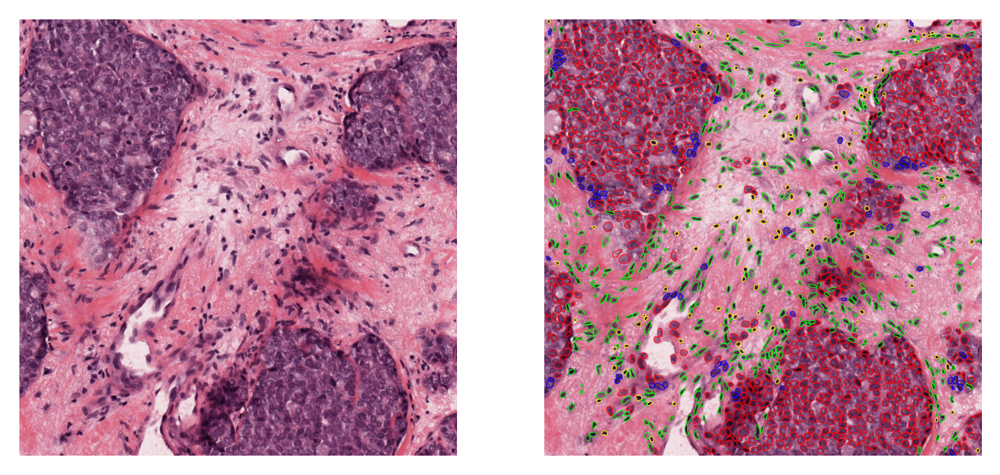

In [26]:
# Reading the original image
tile_img = imread(tile_paths[0])

# defining the coloring dictionary:
# A dictionary that specifies a color to each class {type_id : (type_name, colour)}
color_dict = {
    0: ("neoplastic epithelial", (255, 0, 0)),
    1: ("Inflammatory", (255, 255, 0)),
    2: ("Connective", (0, 255, 0)),
    3: ("Dead", (0, 0, 0)),
    4: ("non-neoplastic epithelial", (0, 0, 255)),
    5: ("background", (255, 165, 0)),
}

# Create the overlay image
overlaid_predictions = overlay_prediction_contours(
    canvas=tile_img,
    inst_dict=tile_preds,
    draw_dot=False,
    type_colours=color_dict,
    line_thickness=2,
)

# showing processed results alongside the original images
fig = plt.figure()
ax1 = plt.subplot(1, 2, 1), plt.imshow(tile_img), plt.axis("off")
ax2 = plt.subplot(1, 2, 2), plt.imshow(overlaid_predictions), plt.axis("off")

### cell features

In [29]:
from tiatoolbox.annotation.storage import Annotation, SQLiteStore
from shapely.geometry import  Polygon

In [35]:
annotations = []

for k, v in tile_preds.items():
    print(v)
    props = {"score": v["prob"], "type": v["type"]}
    annotations.append(
        Annotation(Polygon(v["contour"]), props)
    )


{'box': array([14,  5, 28, 21]), 'centroid': array([19.85326087, 12.375     ]), 'contour': array([[16,  5],
       [14,  7],
       [14, 16],
       [15, 17],
       [15, 19],
       [16, 20],
       [22, 20],
       [25, 17],
       [25, 16],
       [26, 15],
       [26, 14],
       [27, 13],
       [27, 10],
       [25,  8],
       [25,  7],
       [24,  7],
       [22,  5]], dtype=int32), 'prob': 0.934782603615312, 'type': 1}
{'box': array([496,   8, 510,  22]), 'centroid': array([501.61016949,  14.96610169]), 'contour': array([[498,   8],
       [497,   9],
       [496,   9],
       [496,  14],
       [497,  15],
       [497,  16],
       [498,  17],
       [498,  18],
       [499,  18],
       [500,  19],
       [500,  20],
       [501,  20],
       [502,  21],
       [506,  21],
       [509,  18],
       [509,  17],
       [508,  16],
       [504,  16],
       [503,  15],
       [504,  14],
       [504,  13],
       [505,  12],
       [504,  11],
       [504,  10],
       [501,  

{'box': array([ 544, 1255,  576, 1288]), 'centroid': array([ 559.15397631, 1270.50930626]), 'contour': array([[ 568, 1255],
       [ 567, 1256],
       [ 564, 1256],
       [ 563, 1257],
       [ 562, 1257],
       [ 561, 1258],
       [ 560, 1258],
       [ 558, 1260],
       [ 557, 1260],
       [ 551, 1266],
       [ 551, 1267],
       [ 549, 1269],
       [ 549, 1270],
       [ 548, 1271],
       [ 548, 1272],
       [ 547, 1273],
       [ 547, 1274],
       [ 545, 1276],
       [ 545, 1279],
       [ 544, 1280],
       [ 544, 1285],
       [ 546, 1287],
       [ 551, 1287],
       [ 552, 1286],
       [ 553, 1286],
       [ 554, 1285],
       [ 555, 1285],
       [ 561, 1279],
       [ 562, 1279],
       [ 562, 1278],
       [ 563, 1277],
       [ 564, 1277],
       [ 572, 1269],
       [ 572, 1268],
       [ 573, 1267],
       [ 573, 1266],
       [ 575, 1264],
       [ 575, 1258],
       [ 573, 1256],
       [ 571, 1256],
       [ 570, 1255]], dtype=int32), 'prob': 0.69712351827

{'box': array([1343,  919, 1358,  938]), 'centroid': array([1349.54625551,  927.39207048]), 'contour': array([[1345,  919],
       [1343,  921],
       [1343,  934],
       [1346,  934],
       [1347,  935],
       [1349,  935],
       [1351,  937],
       [1352,  936],
       [1353,  936],
       [1355,  934],
       [1355,  933],
       [1356,  932],
       [1356,  931],
       [1357,  930],
       [1357,  925],
       [1356,  924],
       [1356,  923],
       [1353,  920],
       [1352,  920],
       [1351,  919]], dtype=int32), 'prob': 0.95154184602845, 'type': 2}
{'box': array([1753,  921, 1814,  959]), 'centroid': array([1785.7980226 ,  940.01694915]), 'contour': array([[1807,  921],
       [1806,  922],
       [1804,  922],
       [1801,  925],
       [1800,  925],
       [1798,  927],
       [1797,  927],
       [1796,  928],
       [1795,  928],
       [1794,  929],
       [1793,  929],
       [1792,  930],
       [1791,  930],
       [1790,  931],
       [1789,  931],
       

In [32]:
annotations[0]

Annotation(POLYGON ((16 5, 14 7, 14 16, 15 17, 15 19, 16 20, 22 20, 25 17, 25 16, 26 15, 26 14, 27 13, 27 10, 25 8, 25 7, 24 7, 22 5, 16 5)), {'score': 0.934782603615312, 'type': 1})

In [72]:
# spatial information associated with a nucleus detection
# stats calculation taken from https://github.com/adamshephard/OMTscoring_inference/blob/bbd204c2280713f8830ea505ce5588a087ec5312/utils/features/morph.py#L7
def get_nucleus_stats(inst_dict, nuc_id, slide):
    inst_cnt = np.array(inst_dict['contour']).astype(np.float32)
    inst_box = np.array([
        [np.min(inst_cnt[:,1]), np.min(inst_cnt[:,0])],
        [np.max(inst_cnt[:,1]), np.max(inst_cnt[:,0])]
    ])
    bbox_h, bbox_w = inst_box[1] - inst_box[0]
    bbox_aspect_ratio = float(bbox_w / bbox_h)
    bbox_area = bbox_h * bbox_w
    contour_area = cv2.contourArea(inst_cnt)
    extent = float(contour_area) / bbox_area
    convex_hull = cv2.convexHull(inst_cnt)
    convex_area = cv2.contourArea(convex_hull)
    convex_area = convex_area if convex_area != 0 else 1
    solidity = float(contour_area) / convex_area
    equiv_diameter = np.sqrt(4 * contour_area / np.pi)
    if inst_cnt.shape[0] > 4:
        _, axes, orientation = cv2.fitEllipse(inst_cnt)
        major_axis_length = max(axes)
        minor_axis_length = min(axes)
    else:
        orientation = 0
        major_axis_length = 1
        minor_axis_length = 1
    perimeter = cv2.arcLength(inst_cnt, True)
    _, radius = cv2.minEnclosingCircle(inst_cnt)
    eccentricity = np.sqrt(1- (minor_axis_length / major_axis_length)**2)
    
    stat_dict = {}
    stat_dict['nuc_id'] = nuc_id
    stat_dict['wsi_id'] = slide
    stat_dict['type'] = inst_dict["type"]
    stat_dict['type_h'] = [i[0] for i in color_dict.values()][inst_dict["type"]] # human readable labels
    stat_dict['prob'] = inst_dict["prob"]
    stat_dict['eccentricity'] = eccentricity
    stat_dict['convex_area'] = convex_area
    stat_dict['contour_area'] = contour_area
    stat_dict['equiv_diameter'] = equiv_diameter
    stat_dict['extent'] = extent
    stat_dict['major_axis_length'] = major_axis_length
    stat_dict['minor_axis_length'] = minor_axis_length
    stat_dict['perimeter'] = perimeter
    stat_dict['solidity'] = solidity
    stat_dict['orientation'] = orientation
    stat_dict['radius'] = radius
    stat_dict['bbox_area'] = bbox_area
    stat_dict['bbox_aspect_ratio'] = bbox_aspect_ratio
    return stat_dict

In [73]:
res = []
# for every detected nucleus, calculate its properties
for k, v in tile_preds.items():

    f = get_nucleus_stats(v, k, tile_paths[0])
    res.append(f)

In [188]:
df = pd.DataFrame(res)
df

,nuc_id,wsi_id,type,type_h,prob,eccentricity,convex_area,contour_area,equiv_diameter,extent,major_axis_length,minor_axis_length,perimeter,solidity,orientation,radius,bbox_area,bbox_aspect_ratio
0,91a7acb901c84fea8862ebd27f296a0b,adcc_3696_patches/17.png,1,Inflammatory,0.934783,0.526932,165.5,161.5,14.339742,0.828205,16.333212,13.881720,48.384776,0.975831,179.007538,8.164982,195.0,0.866667
1,07fc7fba5c6646d18d4e854eaf722cea,adcc_3696_patches/17.png,3,Dead,0.432203,0.849504,116.0,96.5,11.084567,0.571006,16.914413,8.923743,47.213203,0.831897,135.516586,7.938393,169.0,1.000000
2,0d9f6973a90044f2b106126dc6b66154,adcc_3696_patches/17.png,0,neoplastic epithelial,0.911357,0.831782,344.0,329.0,20.466944,0.623106,27.829758,15.448363,75.254833,0.956395,129.633591,13.901539,528.0,1.090909
3,a61e72acec904c65a3800c3308287d9d,adcc_3696_patches/17.png,0,neoplastic epithelial,0.965517,0.470977,806.5,762.5,31.158388,0.726190,36.163696,31.901636,110.669047,0.945443,167.218597,18.523624,1050.0,1.166667
4,35bd1f4c87ee4b2fb04fd30212c6c67d,adcc_3696_patches/17.png,0,neoplastic epithelial,0.581532,0.768820,500.0,470.5,24.475686,0.668324,31.350178,20.047358,88.669047,0.941000,161.950928,16.620869,704.0,0.687500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5783,ee5ac10ceb6443f087ef392f10da74ff,adcc_3696_patches/2.png,4,non-neoplastic epithelial,0.615385,0.559210,355.5,345.0,20.958713,0.756579,23.553396,19.526375,71.941125,0.970464,77.279739,12.165997,456.0,1.263158
5784,476987a2d4c84c9ebeea46bb898197de,adcc_3696_patches/2.png,4,non-neoplastic epithelial,0.909677,0.843709,441.5,429.0,23.371345,0.672414,32.135178,17.250214,83.254833,0.971687,117.579453,15.692455,638.0,1.318182
5785,cf4c2e89afb749cb96bbcdf08226e80f,adcc_3696_patches/2.png,0,neoplastic epithelial,0.419780,0.725882,431.0,420.0,23.124892,0.734266,28.252853,19.432865,79.597979,0.974478,120.206772,14.333643,572.0,1.181818
5786,19ce110127a34c92afd9c28c7542fc2b,adcc_3696_patches/2.png,4,non-neoplastic epithelial,0.569061,0.605234,709.5,679.5,29.413709,0.730645,33.149963,26.388945,101.497474,0.957717,144.519974,16.919024,930.0,0.967742


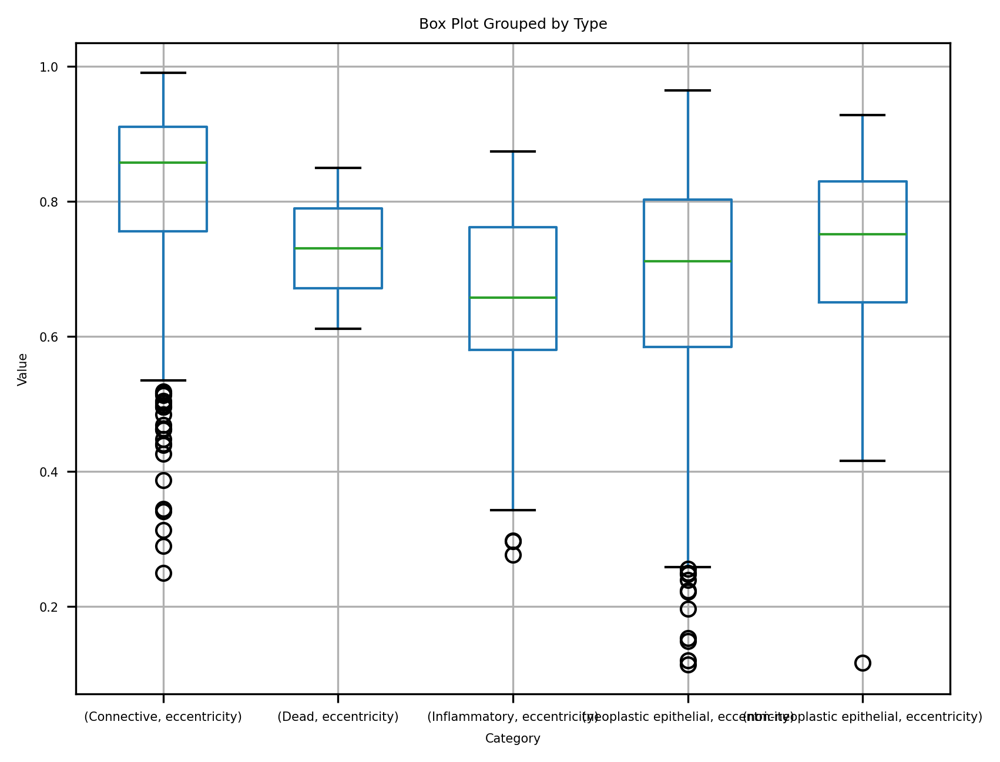

In [78]:
# plot the eccentricity whisker plot by detected type
grouped_types = df.groupby('type_h')
grouped_types.boxplot(column='eccentricity', subplots=False)
plt.title('Box Plot Grouped by Type')
plt.xlabel('Category')
plt.ylabel('Value')
plt.show()

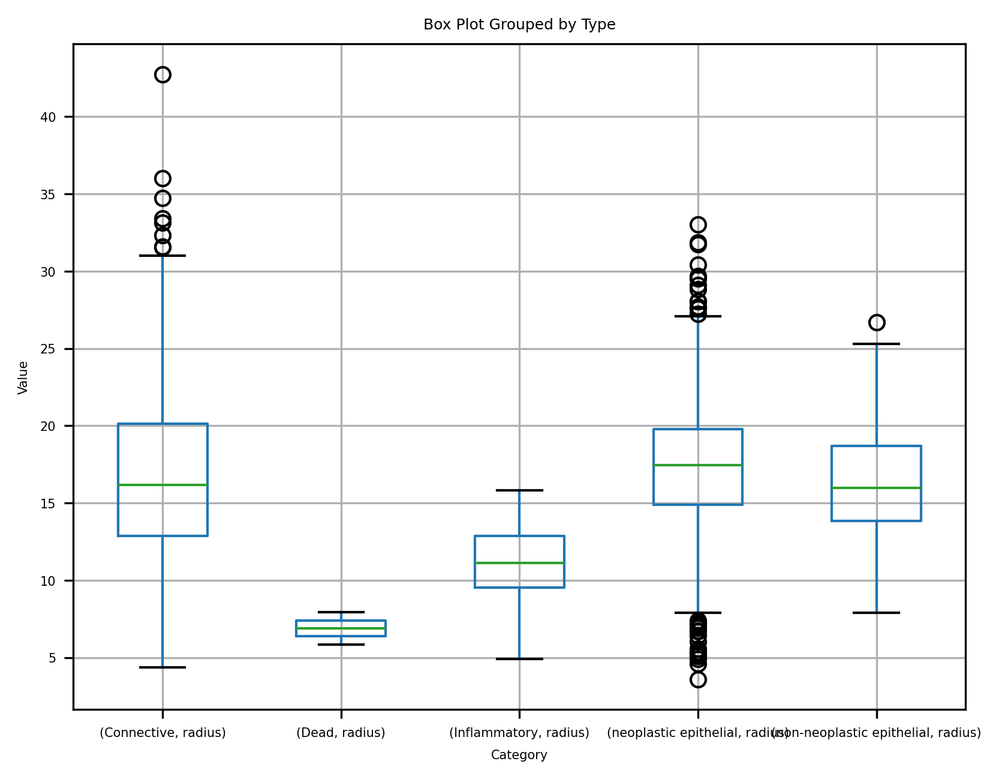

In [77]:
grouped_types = df.groupby('type_h')
grouped_types.boxplot(column='radius', subplots=False)
plt.title('Box Plot Grouped by Type')
plt.xlabel('Category')
plt.ylabel('Value')
plt.show()

In [214]:
def extract_tiles(wsi_name, im_save_path = "tmp/img", wsi_dir = "/home/john/Data/WSI/sheffield_flat/", overwrite=False, power=40):
    fixed_patch_extractor = patchextraction.get_patch_extractor(
        input_img=os.path.join(wsi_dir, wsi_name),  # input image path, numpy array, or WSI object
        method_name="slidingwindow",  # also supports "point" and "slidingwindow"
        patch_size=(
            500,
            500,
        ),  # size of the patch to extract around the centroids from centroids_list
        # stride=(500, 500),  # stride of extracting patches, default is equal to patch_size
        input_mask="otsu",
        min_mask_ratio=0.5,
        units="power",
        resolution=power, #0.5mpp is 1/2 the max resolution
    )
#     print(f"{len(fixed_patch_extractor)} patches for {wsi_name}")

    path = f"{im_save_path}/{wsi_name.lower()}__{power}x_patches"
    if not os.path.exists(path):
        os.makedirs(path)
    #save tiles
    for i, tile in tqdm(enumerate(fixed_patch_extractor), total=len(fixed_patch_extractor)):
        tile_name = f"{path}/{i}.png"
        if not Path(tile_name).is_file() or overwrite:
            plt.imsave(tile_name, tile)

In [223]:
def predict_tiles(wsi_name, im_save_path = "tmp/img", prediction_save_path="tmp/pred", power=40):
    path = f"{im_save_path}/{wsi_name.lower()}_patches"
    
    # get all the generated patch images for this wsi & power
    directory_path = f"{im_save_path}/{wsi_name.lower()}__{power}x_patches"
    tile_paths = [os.path.join(directory_path, f) for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]

    # Tile prediction
    inst_segmentor = NucleusInstanceSegmentor(
        pretrained_model="hovernet_fast-pannuke",
        num_loader_workers=20,
        num_postproc_workers=20,
        batch_size=40,
    )
    save_tile_loc = os.path.join(prediction_save_path, f"{wsi_name}_{power}x")
    tile_output = inst_segmentor.predict(
        tile_paths,
        save_dir=save_tile_loc,
        mode="tile",
        on_gpu=True,
        crash_on_exception=True,
    )


In [217]:
# def predict_wsi(wsi_name, prediction_save_path="tmp/pred", wsi_dir = "/home/john/Data/WSI/sheffield_flat/"):
#     wsi_path = os.path.join(wsi_dir, wsi_name)
    
#     # get the resolution more accurately, so TIAToolbox avoids warnings
# #     power = WSIReader.open(wsi_path).info.as_dict()["objective_power"]
    
#     # WSI prediction
#     inst_segmentor = NucleusInstanceSegmentor(
#         pretrained_model="hovernet_fast-pannuke",
#         num_loader_workers=40,
#         num_postproc_workers=40,
#         batch_size=40,
#     )
#     save_tile_loc = os.path.join(prediction_save_path,wsi_name)
#     tile_output = inst_segmentor.predict(
#         [wsi_path],
#         save_dir=save_tile_loc,
#         mode="wsi",
#         on_gpu=True,
#         crash_on_exception=True,
#         units = "mpp",
#         resolution = 0.5, #0.5 mpp = 20x resolution, about 50% the max zoom size (which is 0.25 mpp = 40x power)
#     )


In [231]:
def extract_params(wsi_name, prediction_load_path="tmp/pred", power=40):
    res = []
    save_tile_loc = os.path.join(prediction_load_path,f"{wsi_name}_{power}x")
    read_dictionary = np.load(f'{save_tile_loc}/file_map.dat',allow_pickle='TRUE')
#     print(read_dictionary)
    for im_name, res_loc in read_dictionary:
        tile_preds = joblib.load(f"{res_loc}.dat")
        print(f"Number of detected nuclei: {len(tile_preds)}")

        # for every detected nucleus, calculate its properties
        for k, v in tile_preds.items():

            f = get_nucleus_stats(v, k, im_name)
            res.append(f)
    return res

In [236]:
extract_tiles(wsi_name = "AdCC_3696.svs", power=20)

1322 patches for AdCC_3696.svs


  0%|          | 0/1322 [00:00<?, ?it/s]

In [237]:
%%time
predict_tiles(wsi_name = "AdCC_3696.svs", power=20)

ValueError: `save_dir` already exists! /home/john/Documents/TAMM/tmp/pred/AdCC_3696.svs_20x

In [240]:
res = extract_params(wsi_name = "AdCC_3696.svs", power=20)
res

Number of detected nuclei: 335
Number of detected nuclei: 274
Number of detected nuclei: 341
Number of detected nuclei: 399
Number of detected nuclei: 479
Number of detected nuclei: 431
Number of detected nuclei: 460
Number of detected nuclei: 337
Number of detected nuclei: 255
Number of detected nuclei: 464
Number of detected nuclei: 277
Number of detected nuclei: 422
Number of detected nuclei: 326
Number of detected nuclei: 389
Number of detected nuclei: 110
Number of detected nuclei: 200
Number of detected nuclei: 318
Number of detected nuclei: 419
Number of detected nuclei: 330
Number of detected nuclei: 241
Number of detected nuclei: 365
Number of detected nuclei: 355
Number of detected nuclei: 310
Number of detected nuclei: 410
Number of detected nuclei: 317
Number of detected nuclei: 337
Number of detected nuclei: 368
Number of detected nuclei: 362
Number of detected nuclei: 375
Number of detected nuclei: 288
Number of detected nuclei: 349
Number of detected nuclei: 225
Number o

Number of detected nuclei: 307
Number of detected nuclei: 352
Number of detected nuclei: 340
Number of detected nuclei: 364
Number of detected nuclei: 342
Number of detected nuclei: 377
Number of detected nuclei: 425
Number of detected nuclei: 390
Number of detected nuclei: 397
Number of detected nuclei: 306
Number of detected nuclei: 348
Number of detected nuclei: 478
Number of detected nuclei: 455
Number of detected nuclei: 286
Number of detected nuclei: 243
Number of detected nuclei: 303
Number of detected nuclei: 304
Number of detected nuclei: 254
Number of detected nuclei: 313


[{'nuc_id': '4ee2fe0ad4064c559f4ca7b16fb24f27',
  'wsi_id': 'tmp/img/adcc_3696.svs__20x_patches/347.png',
  'type': 0,
  'type_h': 'neoplastic epithelial',
  'prob': 0.853658532421178,
  'eccentricity': 0.6443853687252904,
  'convex_area': 218.5,
  'contour_area': 178.0,
  'equiv_diameter': 15.054455784347004,
  'extent': 0.5493827160493827,
  'major_axis_length': 19.601322174072266,
  'minor_axis_length': 14.98914909362793,
  'perimeter': 68.42640614509583,
  'solidity': 0.8146453089244852,
  'orientation': 38.415191650390625,
  'radius': 10.522287368774414,
  'bbox_area': 324.0,
  'bbox_aspect_ratio': 1.0},
 {'nuc_id': '06d1b497243943cab6d54306ced538d9',
  'wsi_id': 'tmp/img/adcc_3696.svs__20x_patches/347.png',
  'type': 0,
  'type_h': 'neoplastic epithelial',
  'prob': 0.9999999885057473,
  'eccentricity': 0.5423157889059997,
  'convex_area': 74.5,
  'contour_area': 71.5,
  'equiv_diameter': 9.541311620975605,
  'extent': 0.8125,
  'major_axis_length': 11.136606216430664,
  'minor_a

In [241]:
df = pd.DataFrame(res)
df

,nuc_id,wsi_id,type,type_h,prob,eccentricity,convex_area,contour_area,equiv_diameter,extent,major_axis_length,minor_axis_length,perimeter,solidity,orientation,radius,bbox_area,bbox_aspect_ratio
0,4ee2fe0ad4064c559f4ca7b16fb24f27,tmp/img/adcc_3696.svs__20x_patches/347.png,0,neoplastic epithelial,0.853659,0.644385,218.5,178.0,15.054456,0.549383,19.601322,14.989149,68.426406,0.814645,38.415192,10.522287,324.0,1.000000
1,06d1b497243943cab6d54306ced538d9,tmp/img/adcc_3696.svs__20x_patches/347.png,0,neoplastic epithelial,1.000000,0.542316,74.5,71.5,9.541312,0.812500,11.136606,9.356695,32.727922,0.959732,86.108009,5.700977,88.0,1.375000
2,8f88ae25279844168141efd34ec8c8ba,tmp/img/adcc_3696.svs__20x_patches/347.png,0,neoplastic epithelial,0.994475,0.625169,169.5,159.0,14.228320,0.668067,16.361439,12.769931,50.284271,0.938053,16.413118,8.631438,238.0,0.823529
3,6ebe99633b424bedada570770f017307,tmp/img/adcc_3696.svs__20x_patches/347.png,0,neoplastic epithelial,1.000000,0.891690,121.5,115.5,12.126795,0.641667,19.595251,8.869720,45.213203,0.950617,144.508209,9.013978,180.0,0.800000
4,f59739b412884c588012ffb0e73331df,tmp/img/adcc_3696.svs__20x_patches/347.png,0,neoplastic epithelial,0.986957,0.835512,220.5,203.0,16.076928,0.634375,22.583380,12.408944,60.284271,0.920635,157.235764,10.684339,320.0,0.800000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94327,fed895d43ea342c4b6d710f9e193dd6b,tmp/img/adcc_3696.svs__20x_patches/965.png,3,Dead,1.000000,0.714500,25.5,25.0,5.641896,0.714286,7.524820,5.264630,19.313708,0.980392,105.057297,3.571542,35.0,1.400000
94328,353556c11fc84e57a4bc384db4dc5659,tmp/img/adcc_3696.svs__20x_patches/965.png,0,neoplastic epithelial,0.874720,0.705931,437.5,410.0,22.847937,0.711806,27.565105,19.523819,82.769552,0.937143,38.231533,14.607526,576.0,1.000000
94329,0be4d8c56b984aa0838c571756728aaf,tmp/img/adcc_3696.svs__20x_patches/965.png,3,Dead,0.941748,0.881369,91.0,85.5,10.433695,0.678571,15.999586,7.558675,38.384776,0.939560,73.761818,7.433135,126.0,1.555556
94330,fb09894eb86b437ab6c7957551b3dea2,tmp/img/adcc_3696.svs__20x_patches/965.png,3,Dead,0.919708,0.527070,122.5,118.0,12.257335,0.766234,13.483658,11.458706,41.798990,0.963265,80.970367,7.159011,154.0,1.272727


In [242]:
df["wsi_id"].unique()

array(['tmp/img/adcc_3696.svs__20x_patches/347.png',
       'tmp/img/adcc_3696.svs__20x_patches/553.png',
       'tmp/img/adcc_3696.svs__20x_patches/571.png',
       'tmp/img/adcc_3696.svs__20x_patches/622.png',
       'tmp/img/adcc_3696.svs__20x_patches/242.png',
       'tmp/img/adcc_3696.svs__20x_patches/368.png',
       'tmp/img/adcc_3696.svs__20x_patches/311.png',
       'tmp/img/adcc_3696.svs__20x_patches/320.png',
       'tmp/img/adcc_3696.svs__20x_patches/919.png',
       'tmp/img/adcc_3696.svs__20x_patches/763.png',
       'tmp/img/adcc_3696.svs__20x_patches/672.png',
       'tmp/img/adcc_3696.svs__20x_patches/1046.png',
       'tmp/img/adcc_3696.svs__20x_patches/810.png',
       'tmp/img/adcc_3696.svs__20x_patches/1254.png',
       'tmp/img/adcc_3696.svs__20x_patches/602.png',
       'tmp/img/adcc_3696.svs__20x_patches/1196.png',
       'tmp/img/adcc_3696.svs__20x_patches/1013.png',
       'tmp/img/adcc_3696.svs__20x_patches/807.png',
       'tmp/img/adcc_3696.svs__20x_patches

In [326]:
def patch_stats(filtered_df):
    """calculate the statistics for a given patch, split by epithelial/other"""
    
    # Are they all the same patch?
    assert len(filtered_df["wsi_id"].unique()) == 1, "multiple patches passed"
    
    epithelial_df = filtered_df[filtered_df['type'].isin([0, 4])]
    other_df = filtered_df[filtered_df['type'].isin([1, 2, 3, 5])]
        
    nuc_type_dfs = [epithelial_df, other_df]
    human_label = ["epithelial", "other"]    
    res_series = []

    for df, hl in zip(nuc_type_dfs, human_label):
        # drop the numeric 'type' and 'prob' columns in the caclulations
        df = df.drop(["type", "prob"], axis=1)

        mean = df.mean(numeric_only = True).rename(lambda x: x + '_mean')
        var = df.var(numeric_only = True).rename(lambda x: x + '_var')
        minimum = df.min(numeric_only = True).rename(lambda x: x + '_min')
        maximum = df.max(numeric_only = True).rename(lambda x: x + '_max')
        
    
        combined_series = pd.concat([mean, var, minimum, maximum])
        combined_series = combined_series.rename(lambda x: x + f'_{hl}')
        res_series.append(combined_series)
    
    return pd.concat(res_series)

In [327]:
patch_stats(df[df["wsi_id"] == "tmp/img/adcc_3696.svs__20x_patches/347.png"])

eccentricity_mean_epithelial        0.686327
convex_area_mean_epithelial       216.107509
contour_area_mean_epithelial      202.382253
equiv_diameter_mean_epithelial     15.691954
extent_mean_epithelial              0.706623
                                     ...    
solidity_max_other                  0.981651
orientation_max_other             172.060715
radius_max_other                   17.951422
bbox_area_max_other               540.000000
bbox_aspect_ratio_max_other         2.571429
Length: 104, dtype: float64